<a href="https://colab.research.google.com/github/Thiksiga/Video_compression/blob/main/video_comp_my.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [273]:
import cv2
import pickle
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow  # For displaying images in Colab

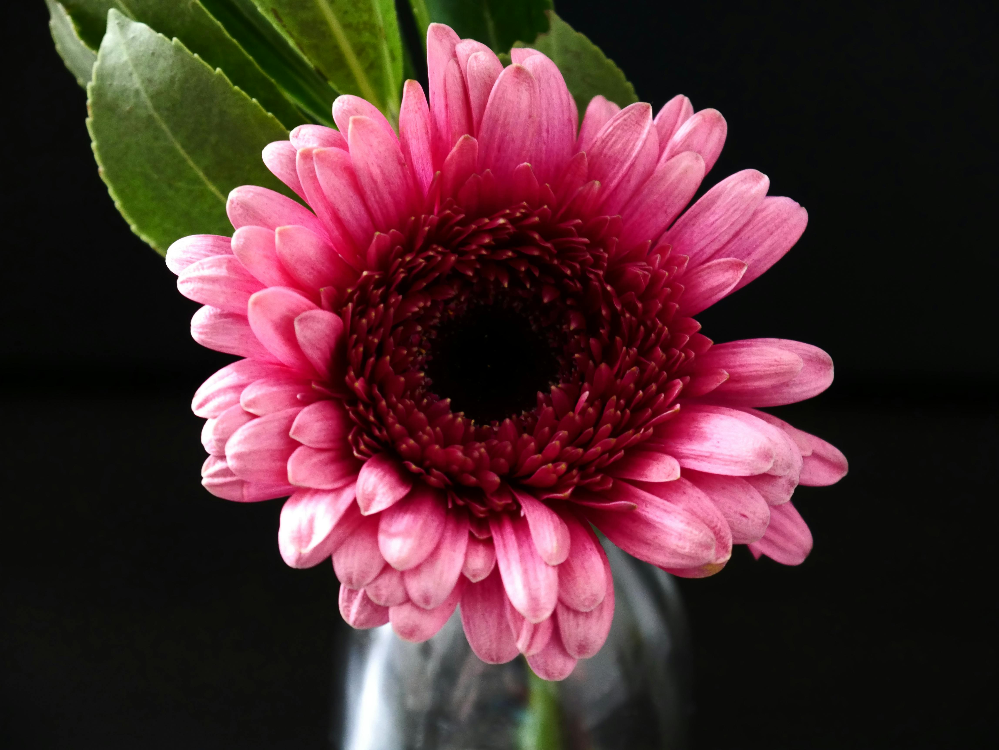

In [274]:
# Specify the path to your image file
image_path = "/content/flwr1.jpg"

# Load the image using OpenCV
image = cv2.imread(image_path)

# Display the image
cv2_imshow(image)

# # Display the image         (NOT DISPLAYING PROPER COLOURINGS)
# plt.imshow(image)
# plt.axis('off')  # Turn off axis labels
# plt.show()

In [275]:
#Checking the image parameters
print(image)
print(image.shape)

[[[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 8 11  9]
  [ 8 11  9]
  [ 8 11  9]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 8 11  9]
  [ 8 11  9]
  [ 8 11  9]]

 [[ 8  8  8]
  [ 8  8  8]
  [ 8  8  8]
  ...
  [ 8 11  9]
  [ 8 11  9]
  [ 8 11  9]]

 ...

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [ 5  8  6]
  [ 5  8  6]
  [ 5  8  6]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [ 5  8  6]
  [ 5  8  6]
  [ 5  8  6]]

 [[11 11 11]
  [11 11 11]
  [11 11 11]
  ...
  [ 5  8  6]
  [ 5  8  6]
  [ 5  8  6]]]
(3448, 4592, 3)


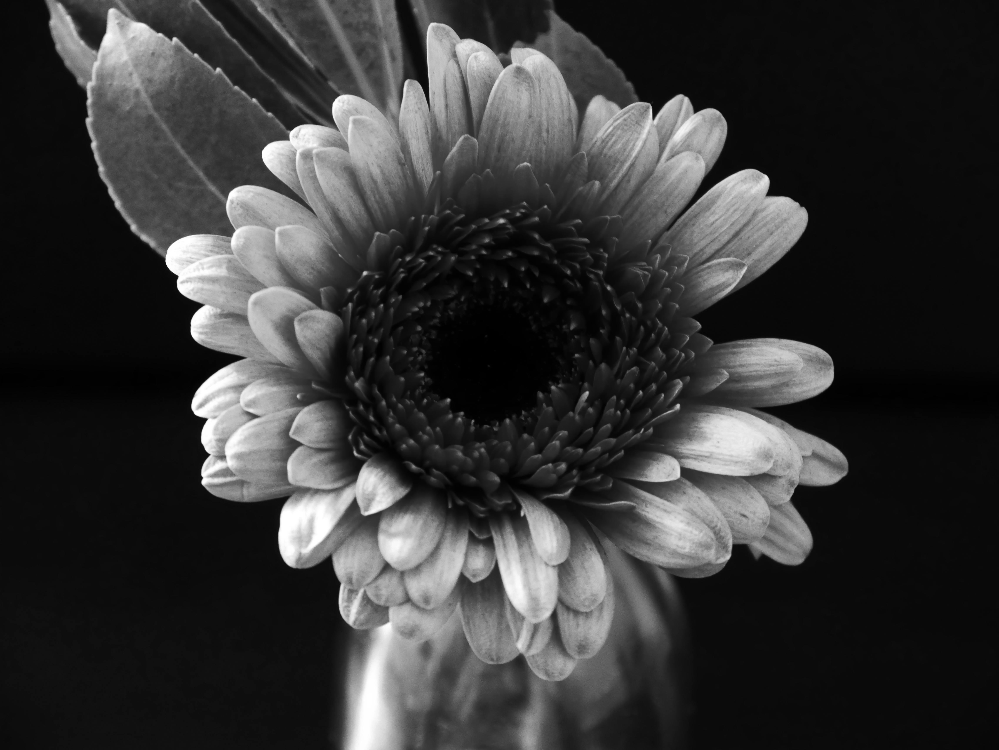

(3448, 4592)


In [276]:
#Convert image to Gray scale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

original_im_shape=gray_image.shape
cv2_imshow(gray_image)
print(original_im_shape)

In [277]:
print(gray_image)

[[ 8  8  8 ... 10 10 10]
 [ 8  8  8 ... 10 10 10]
 [ 8  8  8 ... 10 10 10]
 ...
 [11 11 11 ...  7  7  7]
 [11 11 11 ...  7  7  7]
 [11 11 11 ...  7  7  7]]


### Forward transform coding

---



In [278]:
dct_result = cv2.dct(np.float32(gray_image))
# print(dct_result)

### Spliting image into macro blocks with size of 8*8
---




In [279]:
def split_into_blocks(matrix, block_size=8):
    rows, cols = matrix.shape
    block_matrices = []

    for row in range(0, rows, block_size):
        for col in range(0, cols, block_size):
            block = matrix[row:row+block_size, col:col+block_size]
            block_matrices.append(block)

    return block_matrices

In [280]:
# Split the large matrix into 8x8 macro blocks
blocks = split_into_blocks(dct_result, block_size=8)
print(blocks[0]) #217136.

[[ 2.1713756e+05  3.3829141e+04 -9.5757023e+04 -2.0742834e+04
  -5.2185863e+04  1.6784307e+03  1.7106395e+04 -1.0224409e+04]
 [ 1.4890349e+04  2.9498207e+04  2.7738855e+04 -4.6011347e-01
  -2.6602770e+04 -2.4981680e+04 -8.4421836e+03 -8.5449014e+03]
 [ 3.1212917e+03  1.7150109e+04 -3.4149602e+04 -1.6213212e+03
   9.1671102e+04  9.5229834e+03 -1.8287768e+04 -1.9915996e+04]
 [ 1.9969555e+04 -6.0951611e+03 -1.1950425e+04  1.1249696e+04
   1.1575245e+04  1.5005071e+04 -4.0528750e+03 -6.1653047e+03]
 [-4.2742570e+04  1.1078915e+04  4.6414930e+04 -1.0124492e+04
  -2.9912585e+03 -2.0486256e+02 -2.2631078e+04  7.0191089e+03]
 [-2.1280164e+04  9.9314258e+03  5.7942085e+03 -5.4152539e+03
   3.0036420e+04 -8.4034990e+03 -1.9897082e+04  5.0476963e+03]
 [-1.0800861e+03  2.8515012e+03  2.2813459e+04 -4.5557549e+03
  -3.3893719e+04  9.0148203e+03  1.1374503e+04 -6.9482407e+03]
 [-4.1273545e+03 -1.5847861e+03  1.8240350e+04  5.5827876e+03
  -1.8302717e+04 -1.9301765e+03 -6.7835933e+03 -2.6684940e+02]]

In [281]:

# print("\n8x8 Macro Blocks:")
# for block in blocks:
#     print(block)
#     print()


# Quantizing

---



In [282]:
def quantize(block, quality):
    # Quality levels for JPEG (Q50, Q70, Q90)
    quality_factors = np.array([
        [16, 11, 10, 16, 24, 40, 51, 61],
        [12, 12, 14, 19, 26, 58, 60, 55],
        [14, 13, 16, 24, 40, 57, 69, 56],
        [14, 17, 22, 29, 51, 87, 80, 62],
        [18, 22, 37, 56, 68, 109, 103, 77],
        [24, 35, 55, 64, 81, 104, 113, 92],
        [49, 64, 78, 87, 103, 121, 120, 101],
        [72, 92, 95, 98, 112, 100, 103, 99]
    ])

    if quality < 40:
        scale = 40 / quality
        quality_level = "Low Quality"
    elif 40 <= quality <= 70:
        scale = 2 - quality / 70
        quality_level = "Medium Quality"
    else:
        scale = 100 / quality
        quality_level = "High Quality"

    quantized_block = np.round(block / ((quality_factors + 100)* scale))

    return quantized_block, quality_level

def dequantize(quantized_block, quality):
    # Quality levels for JPEG (Q50, Q70, Q90)
    quality_factors = np.array([
        [16, 11, 10, 16, 24, 40, 51, 61],
        [12, 12, 14, 19, 26, 58, 60, 55],
        [14, 13, 16, 24, 40, 57, 69, 56],
        [14, 17, 22, 29, 51, 87, 80, 62],
        [18, 22, 37, 56, 68, 109, 103, 77],
        [24, 35, 55, 64, 81, 104, 113, 92],
        [49, 64, 78, 87, 103, 121, 120, 101],
        [72, 92, 95, 98, 112, 100, 103, 99]
    ])

    if quality < 40:
        scale = 40 / quality
    elif 40 <= quality <= 70:
        scale = 2 - quality / 70
    else:
        scale = 100 / quality

    return quantized_block * ((quality_factors + 100) * scale)


In [283]:
# Quantize the DCT coefficients at different quality levels
quantized_dct_high, quality_level_high = quantize(blocks, 90)

print(quantized_dct_high[0:2])
print(type(quantized_dct_high[0][0][0]))

[[[ 1.685e+03  2.740e+02 -7.830e+02 -1.610e+02 -3.790e+02  1.100e+01
    1.020e+02 -5.700e+01]
  [ 1.200e+02  2.370e+02  2.190e+02 -0.000e+00 -1.900e+02 -1.420e+02
   -4.700e+01 -5.000e+01]
  [ 2.500e+01  1.370e+02 -2.650e+02 -1.200e+01  5.890e+02  5.500e+01
   -9.700e+01 -1.150e+02]
  [ 1.580e+02 -4.700e+01 -8.800e+01  7.800e+01  6.900e+01  7.200e+01
   -2.000e+01 -3.400e+01]
  [-3.260e+02  8.200e+01  3.050e+02 -5.800e+01 -1.600e+01 -1.000e+00
   -1.000e+02  3.600e+01]
  [-1.540e+02  6.600e+01  3.400e+01 -3.000e+01  1.490e+02 -3.700e+01
   -8.400e+01  2.400e+01]
  [-7.000e+00  1.600e+01  1.150e+02 -2.200e+01 -1.500e+02  3.700e+01
    4.700e+01 -3.100e+01]
  [-2.200e+01 -7.000e+00  8.400e+01  2.500e+01 -7.800e+01 -9.000e+00
   -3.000e+01 -1.000e+00]]

 [[ 8.900e+01 -9.000e+01 -2.000e+00  6.900e+01 -8.600e+01 -7.800e+01
   -1.900e+01  6.000e+01]
  [ 2.200e+01  9.000e+00 -1.560e+02 -9.000e+01  3.000e+01  6.800e+01
    4.200e+01 -3.400e+01]
  [-4.310e+02 -1.110e+02  1.200e+01  6.800e+01  

# Entropy encoding

---



In [284]:
import heapq
from collections import defaultdict

def calculate_frequencies(arr):
    frequencies = defaultdict(int)
    for row in arr:
        for col in row:
            for value in col:
                frequencies[value] += 1
    return frequencies

def build_huffman_tree(frequencies):
    heap = [[weight, [value, ""]] for value, weight in frequencies.items()]
    heapq.heapify(heap)
    while len(heap) > 1:
        lo = heapq.heappop(heap)
        hi = heapq.heappop(heap)
        for pair in lo[1:]:
            pair[1] = '0' + pair[1]
        for pair in hi[1:]:
            pair[1] = '1' + pair[1]
        heapq.heappush(heap, [lo[0] + hi[0]] + lo[1:] + hi[1:])
    return heap[0][1:]

def generate_huffman_code(tree):
    huffman_code = {}
    for value, code in tree:
        huffman_code[value] = code
    return huffman_code

def huffman_encode(arr, huffman_code):
    encoded_arr = [[[huffman_code[value] for value in col] for col in row] for row in arr]
    return encoded_arr

def huffman_decode(encoded_arr, huffman_code):
    decoding_dict = {code: value for value, code in huffman_code.items()}
    decoded_arr = [[[decoding_dict[code] for code in col] for col in row] for row in encoded_arr]
    return decoded_arr

# Input array
# input_arr = [[[1.3571e+04, 3.0750e+03, -9.5760e+03, -1.2960e+03, -2.1740e+03, 4.2000e+01, 3.3500e+02, -1.6800e+02],
#               [1.2410e+03, 2.4580e+03, 1.9810e+03, -0.0000e+00, -1.0230e+03, -4.3100e+02, -1.4100e+02, -1.5500e+02],
#               # ... (remaining rows)
#              ]]

input_arr=quantized_dct_high

# Calculate frequencies
frequencies = calculate_frequencies(input_arr)

# Build Huffman tree
huffman_tree = build_huffman_tree(frequencies)

# Generate Huffman code
huffman_code = generate_huffman_code(huffman_tree)

# Huffman encode the input array
encoded_arr = huffman_encode(input_arr, huffman_code)

# # Huffman decode the encoded array
# decoded_arr = huffman_decode(encoded_arr, huffman_code)

# Display the results
# print("Huffman Code:", huffman_code)
print("Encoded Array:", encoded_arr[0:8])
print(type(encoded_arr[0]))
# print("Decoded Array:", decoded_arr)
print(huffman_code)


Encoded Array: [[['0101101001100000', '0100011010010011', '01011010011000010', '01011010011001000', '01011010011000100', '01011001010', '01011011111000010', '010110010001100'], ['01011011111000100', '0100011010010010', '0100011010010001', '1', '01011010011000111', '01011010011001100', '010110100111101', '010110100111011'], ['0101100101111', '01011011111000110', '01011010011000110', '01011001001', '0101100100010101', '01011011101101100', '01011010011010010', '01011010011001101'], ['0100011010010000', '010110100111101', '010110010001011', '01011011101111011', '010110011000111', '0101101110111100', '0101101110001', '01000110100101'], ['01011010011000101', '01011011101111100', '0101100100010100', '010110100111010', '010110011011', '011', '01011010011010000', '01011001000011'], ['01011010011001010', '0101101110111001', '010110010110110', '01011010001101', '01011011111000111', '01011010011111100', '01011010011010110', '01000110100111'], ['0101110000', '010110011010', '01011011111000011', '01

In [285]:
def calculate_total_bits(encoded_arr):
    total_bits = 0
    for row in encoded_arr:
        for col in row:
            for code in col:
                total_bits += len(code)
    return total_bits

# Calculate total bits for the encoded array
total_bits = calculate_total_bits(encoded_arr)

# Display the result
print("Total Bits:", total_bits)

file_size=total_bits/1024
print(file_size,"kB")

Total Bits: 15959661
15585.6064453125 kB


In [286]:
def write_encoded_data_to_file(encoded_arr, output_file_path):
    with open(output_file_path, 'w') as file:
        for row in encoded_arr:
            for col in row:
                for code in col:
                    file.write(code)

# Example usage
output_file_path = 'encoded_data.txt'
write_encoded_data_to_file(encoded_arr, output_file_path)

In [287]:


def write_list_to_bin(data_list, output_path):
    # Open the binary file in write mode
    with open(output_path, 'wb') as bin_file:
        # Serialize and write the list to the binary file
        pickle.dump(data_list, bin_file)

# def read_list_from_bin(input_path):
#     # Open the binary file in read mode
#     with open(input_path, 'rb') as bin_file:
#         # Deserialize and read the list from the binary file
#         data_list = pickle.load(bin_file)

#     return data_list

# Example usage
# my_list = [[['0101111011010000100', '0101001010111001111', '01011110110100001010', '01011110111011000000', '01011110110100001101', '010101110111110', '0101001010101101001', '0101111011110010110'], ['0101001010111001000', '0101001010111001110', '0101001010111001100', '1', '01011110111011000010', '0101111011101101101', '010101111101110111', '0101111011110011100'], ['0101001010101001110', '0101001010111001010', '01011110110100001110', '0101100011011101', '0101001010111001101', '010100101010011000', '01011110111011111011', '01011110111011100001'], ['0101001010111001011', '0101111011101110001', '01011110111011010011', '0101001010101110010', '0101001010101010000', '010100101010011011', '0101100010000101', '01010111010000010']]]
bin_file_path = 'my_list.bin'

# Write the list to a binary file
write_list_to_bin(encoded_arr, bin_file_path)

# # Read the list from the binary file
# read_list = read_list_from_bin(bin_file_path)

# print("Original List:", my_list)
# print("Read List:", read_list)



# ***IMAGE*** ***RECONSTRUCTION***

---


In [288]:
def read_list_from_bin(input_path):
    # Open the binary file in read mode
    with open(input_path, 'rb') as bin_file:
        # Deserialize and read the list from the binary file
        data_list = pickle.load(bin_file)

    return data_list

 # Read the list from the binary file
read_list = read_list_from_bin(bin_file_path)
# print(read_list)

# Entropy decoding

---



In [289]:
# Huffman decode the encoded array
# decoded_arr = huffman_decode(encoded_arr , huffman_code)
decoded_arr = huffman_decode(read_list  , huffman_code)
print(decoded_arr)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



# Dequantizing

---



In [290]:
dequantized_blocks=[]
for blocks in decoded_arr:
    # Filter out None values
  filtered_array = np.where(blocks != None, blocks, np.nan)

  # Convert the filtered array to a numeric type (float)
  filtered_array = filtered_array.astype(np.float32)
  dequantized_block=dequantize(filtered_array, 100)
  dequantized_blocks.append(dequantized_block)
print(dequantized_blocks[0:2])


[array([[195460.,  30414., -86130., -18676., -46996.,   1540.,  15402.,
         -9177.],
       [ 13440.,  26544.,  24966.,     -0., -23940., -22436.,  -7520.,
         -7750.],
       [  2850.,  15481., -30740.,  -1488.,  82460.,   8635., -16393.,
        -17940.],
       [ 18012.,  -5499., -10736.,  10062.,  10419.,  13464.,  -3600.,
         -5508.],
       [-38468.,  10004.,  41785.,  -9048.,  -2688.,   -209., -20300.,
          6372.],
       [-19096.,   8910.,   5270.,  -4920.,  26969.,  -7548., -17892.,
          4608.],
       [ -1043.,   2624.,  20470.,  -4114., -30450.,   8177.,  10340.,
         -6231.],
       [ -3784.,  -1344.,  16380.,   4950., -16536.,  -1800.,  -6090.,
          -199.]]), array([[ 10324.,  -9990.,   -220.,   8004., -10664., -10920.,  -2869.,
          9660.],
       [  2464.,   1008., -17784., -10710.,   3780.,  10744.,   6720.,
         -5270.],
       [-49134., -12543.,   1392.,   8432.,  10360.,  -4553.,   2366.,
          4368.],
       [ -1824., -

# Inverse DCT

---



In [291]:
#-------------------------Combining macro blocks-------------------------------------#
def reconstruct_image(blocks, image_shape):
    rows, cols = image_shape
    block_size = blocks[0].shape[0]
    reconstructed_image = np.zeros((rows, cols), dtype=np.float32)

    block_index = 0
    for row in range(0, rows, block_size):
        for col in range(0, cols, block_size):
            reconstructed_image[row:row+block_size, col:col+block_size] = blocks[block_index]
            block_index += 1

    return reconstructed_image


In [292]:

merged_img=reconstruct_image(dequantized_blocks, original_im_shape)
print(merged_img)

[[195460.  30414. -86130. ...     -0.     -0.     -0.]
 [ 13440.  26544.  24966. ...     -0.     -0.     -0.]
 [  2850.  15481. -30740. ...     -0.     -0.     -0.]
 ...
 [    -0.     -0.     -0. ...     -0.     -0.     -0.]
 [    -0.     -0.     -0. ...     -0.     -0.     -0.]
 [    -0.     -0.     -0. ...     -0.     -0.     -0.]]


In [293]:
inverse_dct_result = cv2.idct(np.float32(merged_img))
print(inverse_dct_result[0:3])

[[10.976687 10.64463   9.994759 ...  9.769228  9.824503  9.850954]
 [10.761335 10.437114  9.802477 ...  9.518759  9.565391  9.587635]
 [10.342258 10.033388  9.428581 ...  9.039095  9.069177  9.083372]]


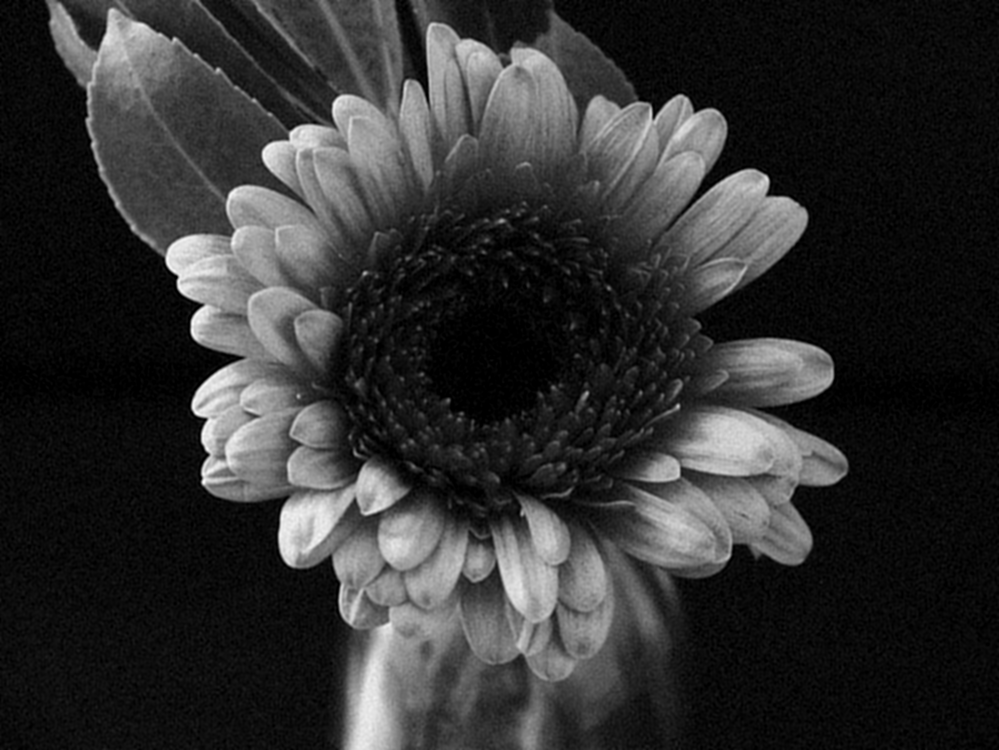

In [294]:
cv2_imshow(inverse_dct_result)